# Topic Modeling (LDA) for lyrics [short version]

## 0. Setup

In [1]:
#import libraries 

import re
import operator
import string
import random
random.seed(1)
import tqdm

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

#nltk imports
import nltk
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords

#gensim imports
import gensim
from gensim import corpora
from gensim.corpora.dictionary import Dictionary
from gensim.models import CoherenceModel

#lda-vis
import pyLDAvis.gensim_models

#spacy
import spacy
nlp = spacy.load('en_core_web_sm')

## 1. Loading Data

In [2]:
#create a df from csv
filename = "data/full_df.csv"
lyrics_df= pd.read_csv(filename)
lyrics_df.rename(columns={ 'Unnamed: 0': 'track_name'}, inplace=True)
lyrics_df.drop('Unnamed: 0.1', inplace=True, axis=1)
lyrics_df.head()

,track_name,playlist_name,playlist_id,playlist_genre,track_id,track_artist_name,track_artist_id,danceability,energy,key,loudness,mode,acousticness,valence,tempo,tabs,dirty_lyrics
0,Back In Black,Rock Classics,37i9dQZF1DWXRqgorJj26U,Rock,08mG3Y1vljYA6bvDt4Wqkj,AC/DC,711MCceyCBcFnzjGY4Q7Un,0.310,0.700,9,-5.678,1,0.0110,0.763,188.386,"E,D,A/C#,E,D,A/C#,E,D,A/C#,E,D,A/C#,E,D,A/C#,A...","[Verse 1]\nBack in black, I hit the sack\nI've..."
1,Paradise City,Rock Classics,37i9dQZF1DWXRqgorJj26U,Rock,3YBZIN3rekqsKxbJc9FZko,Guns N' Roses,3qm84nBOXUEQ2vnTfUTTFC,0.273,0.952,11,-8.762,1,0.0169,0.472,100.271,"G,C,F,C,G,G5,F5,C5,Bb5,C5,C5,Bb5,G,F,G,G,G,C,C...",[Chorus]\nTake me down to the Paradise City\nW...
2,Dream On,Rock Classics,37i9dQZF1DWXRqgorJj26U,Rock,5MxNLUsfh7uzROypsoO5qe,Aerosmith,7Ey4PD4MYsKc5I2dolUwbH,0.307,0.433,1,-10.057,1,0.3880,0.224,160.900,"Fm,Fm6,Bbm6,Fm,C7sus,Fm,Fm,Fm7,Fm6,Bbm6,Fm,Fm7...",[Verse 1]\nEvery time​ that I look in the mirr...
3,Creep,Rock Classics,37i9dQZF1DWXRqgorJj26U,Rock,70LcF31zb1H0PyJoS1Sx1r,Radiohead,4Z8W4fKeB5YxbusRsdQVPb,0.515,0.430,7,-9.935,1,0.0097,0.104,91.844,"G,B,C,Cm,G,B,C,Cm,G,B,C,Cm,G,B,C,Cm,G,B,C,Cm,G...",[Verse 1]\nWhen you were here before\nCouldn't...
4,Don't Stop Believin',Rock Classics,37i9dQZF1DWXRqgorJj26U,Rock,4bHsxqR3GMrXTxEPLuK5ue,Journey,0rvjqX7ttXeg3mTy8Xscbt,0.500,0.748,4,-9.072,1,0.1270,0.514,118.852,"E,B,C#m,A,E,B,G#m,A,E,B,C#m,A,E,B,G#m,A,E,B,C#...",[Verse 1]\nJust a small-town girl\nLivin' in a...


## 1. Data Cleaning

In [3]:
#use length to filter out non-lyrics
lyrics_df['len'] = None
lyrics_df['len'] = lyrics_df['dirty_lyrics'].apply(lambda x: len(str(x)))
lengths = list(lyrics_df['len'])
percentiles = [90, 91, 92, 93, 94, 95, 99]
for p in percentiles:
    print(np.percentile(lengths, p))

3092.0
3246.0
3580.0
3853.0
4322.0
5001.0
89514.0


1564
1701


(array([ 68.,  44., 188., 391., 388., 248., 121.,  56.,  36.,  24.]),
 array([3.0000e+00, 3.5780e+02, 7.1260e+02, 1.0674e+03, 1.4222e+03,
        1.7770e+03, 2.1318e+03, 2.4866e+03, 2.8414e+03, 3.1962e+03,
        3.5510e+03]),
 <BarContainer object of 10 artists>)

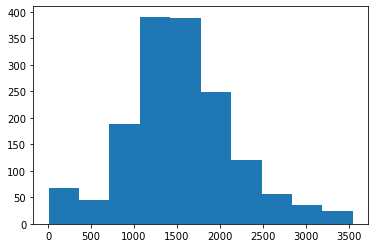

In [4]:
ldf = lyrics_df.loc[lyrics_df.len < np.percentile(lengths, 92)]
print(len(ldf))
print(len(lyrics_df))
plt.hist(ldf.len, bins=10)

In [5]:
#drop NAs from lyrics col
print(ldf.shape)
ldf = ldf[ldf['dirty_lyrics'].notna()]
ldf.reset_index(drop=True, inplace=True)
print(ldf.shape)

(1564, 18)
(1496, 18)


In [6]:
#french lyrics crept in from somewhere, drop it
#found this index heuristically, need to check for other bad data
ldf.iloc[776,-2]

'[Paroles de "RATPI WORLD"]\n\n[Intro]\nArmes automatiques, c\'est fantastique\nC\'est quoi les bails, ma gueule ?\nJ\'suis dans mon Ratpi World, eh\n\n[Couplet 1]\nIls sont v\'nus à six du mat\', rangers, pas de bas résille\nIls veulent nous faire comme rats des villes, encerclés comme en Palestine\nLe pare-chocs embrasse la vitrine, D.U.C : pas d\'la Cristalline\nWallaye, j\'suis sur toi comme un Djinn, c\'est plus grave que tu l\'imagines\nGargouilles sur un toit béni, rate-pi patrouille jour et nuit\nSi tu sais pas qui j\'suis, ton écran plat vient d\'chez Momo Henni\nTout est écrit mais j\'aime pas lire, t\'es faux, ta peau c\'est pas du cuir\nPlein d\'gens que j\'aime mais j\'aime pas l\'dire, plein d\'gens qu\'je gêne veulent me détruire\nQu\'il en soit ainsi, j\'ai toujours laissé le Diable me séduire\nDans l\'bureau à Tony, lance-grenades chargé, grosse cérémonie\nC\'est dur, frérot, la pandémie, avance-moi un kil\' et d\'mi\n9-2, Porte de Châtillon, Lamborghini, portes papill

In [7]:
ldf = ldf.drop(ldf.index[776])

In [8]:
print(ldf.shape)

(1495, 18)


### Helper Functions

In [9]:
def clean_lyrics(lyrics):

    #remove verse/chorus/bridge etc. inside []
    cleaned_lyrics = re.sub(r'\[(.*?)\]','', lyrics)
    #remove genius *embed* words
    cleaned_lyrics = re.sub(r"\S*Embed\S*",'', cleaned_lyrics)
    
    #The below code may be required for some other parts of pipeline
    #For LDA, it is baked into lyrics_to_words
    
    #lowercase and strip
    #cleaned_lyrics = cleaned_lyrics.lower().strip()
    #remove punctuations
    #cleaned_lyrics = re.sub(r"[^\w\d'\s]+",'', cleaned_lyrics)
    
    return cleaned_lyrics 

In [10]:
def read_stopwords(filename):
    stopwords={}
    with open(filename) as file:
        for line in file:
            stopwords[line.rstrip()]=1
    return stopwords

In [11]:
def lyrics_to_words(lyrics):
    
    #for lemmatization
    lemma = WordNetLemmatizer()
    #ps =PorterStemmer()
    
    #lowercase and strip
    tokens = nltk.wordpunct_tokenize(lyrics.lower())
    #tokens = lyrics.lower().split()
        
    stop_words = {k:1 for k in stopwords.words('english')}
    stop_words.update(read_stopwords("data/jockers.stopwords"))
    stop_words["'s"]=1
    stop_words=list(stop_words.keys())
    
    s1 = set(string.punctuation)
    my_punct = ['!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '.',
           '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', 
           '`', '{', '|', '}', '~', '»', '«', '“', '”']
    s2 = set(my_punct)
    exclude = set.union(s1,s2)
    
    stopword_removal = [token for token in tokens if token not in stop_words]
    punct_removal = [token for token in stopword_removal if token not in exclude]
    alnum = [token for token in punct_removal if token.isalnum()]
    normalized = [lemma.lemmatize(word) for word in alnum]
    
    return normalized

In [12]:
#test helper funcs
print(lyrics_to_words(clean_lyrics(str(ldf.dirty_lyrics[0]))))

['black', 'hit', 'sack', 'glad', 'loose', 'noose', 'kept', 'hanging', 'looking', 'sky', 'cause', 'getting', 'high', 'forget', 'hearse', 'cause', 'die', 'life', 'cat', 'eye', 'abusing', 'running', 'wild', 'cause', 'black', 'black', 'cadillac', 'number', 'bullet', 'power', 'pack', 'bang', 'gang', 'catch', 'want', 'cause', 'track', 'beatin', 'flack', 'gonna', 'rap', 'look', 'making', 'play', 'push', 'luck', 'cause', 'black', 'black', 'black', 'black', 'yow', 'ah', 'yeah', 'yeah', 'take', 'yeah', 'yeah', 'yeah', 'ah', 'hey', 'yeah', 'ooh', 'yeah', 'black', 'black', 'hit', 'sack']


In [13]:
ldf['cleaned_lyrics'] = None
ldf['cleaned_lyrics'] = ldf['dirty_lyrics'].apply(lambda x: clean_lyrics(str(x)))
ldf['words_for_LDA'] = None
ldf['words_for_LDA'] = ldf['cleaned_lyrics'].apply(lambda x: lyrics_to_words(str(x)))

In [14]:
words = ldf['words_for_LDA'].tolist()
track_id = ldf['track_id'].tolist()

## 2. Topic Modeling

In [15]:
dictionary = corpora.Dictionary(words)
corpus = [dictionary.doc2bow(text) for text in words]

In [16]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=30, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [17]:
num_topics = 30
topics = {}
for i in range(num_topics):
    print("topic %s:\t%s" % (i, ' '.join([term for term, freq in lda_model.show_topic(i, topn=20)])))
    topics[i] = ' '.join([term for term, freq in lda_model.show_topic(i, topn=20)])

topic 0:	friend call hate help face control hurt cause truth step wanted sad stuck hoo smile fucking straight wonder master trying
topic 1:	yeah world high come alive wild metal space cool kid cause heavy happy nice phone somethin thunder bottle rip story
topic 2:	baby people round blow turn show big fuck keep bout uh em door huh really damn sure bed loving hot
topic 3:	right drink move eh close du higher family slowly raise place taken outside brave fate parking mm spoke worse bomb
topic 4:	night town go train track room light small right wine midnight fight shadow thrill believin fit streetlight city boulevard searchin
topic 5:	leave die lonely known holding lip dying poor drunk trying misery kiss whisper rising jean tough sweet orleans foot lying
topic 6:	da waiting hmm kind freedom true lover california playing nearly watched soft lied shared busted driver windshield called rode rouge
topic 7:	wanna gotta road seen fast hair yesterday bitter beauty slave slow intention symphony rec

In [18]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=words, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.3257804148333726


In [19]:
results_um = []

for t in range(30, 101, 10):
    lda_model = gensim.models.LdaModel(corpus, id2word=dictionary, num_topics=t)
    corpus_lda = lda_model[corpus]

    cm = CoherenceModel(model=lda_model, corpus=corpus_lda, coherence='u_mass')
    score = cm.get_coherence()
    tup = t, score
    results_um.append(tup)

results_um = pd.DataFrame(results_um, columns=['topic', 'score'])

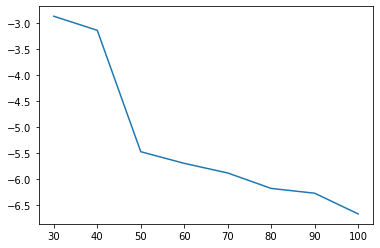

In [20]:
s = pd.Series(results_um.score.values, index=results_um.topic.values)
_ = s.plot()

In [21]:
results_cv = []

for t in range(30, 101, 10):
    lda_model = gensim.models.LdaModel(corpus, id2word=dictionary, num_topics=t)
    corpus_lda = lda_model[corpus]

    cm = CoherenceModel(model=lda_model, texts=words, coherence='c_v')
    score = cm.get_coherence()
    tup = t, score
    results_cv.append(tup)

results_cv = pd.DataFrame(results_cv, columns=['topic', 'score'])

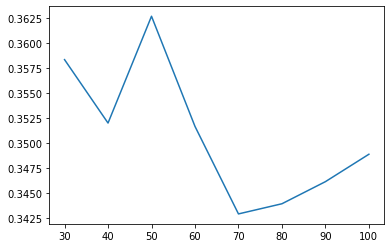

In [22]:
s = pd.Series(results_cv.score.values, index=results_cv.topic.values)
_ = s.plot()

# 3. Optimal Model

In [34]:
optimal_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=50, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [35]:
num_topics = 50
topics = {}
for i in range(num_topics):
    print("topic %s:\t%s" % (i, ' '.join([term for term, freq in optimal_model.show_topic(i, topn=20)])))
    topics[i] = ' '.join([term for term, freq in optimal_model.show_topic(i, topn=20)])

topic 0:	friend hold stay fall face really time truth hide stuck smile demon self broke changed cause finally scared middle ground
topic 1:	yeah ooh somethin bottle dear age question sittin drowning glad cause slide deserve talked chill nasty cool time ancient flood
topic 2:	baby turn round cause black bout uh huh sure loving heard freak hot as gettin door evil beat bang lookin
topic 3:	higher wear grave mouth nice mess attention hello spoke word deal level view kitchen liar poison rider proof joke wine
topic 4:	find red somebody known full wheel blue rhythm bother crowd turnin conscience dy flower breast treat garden microphone guest heard
topic 5:	saw fool slip whisper brought religion confession century heard consider hour anus frequently hallucigons medias doe dearly corpse especially penny
topic 6:	da hmm kind freedom line poor regret nearly ache shared jean busted windshield bandana easy poorest poisonous especially rake frequently
topic 7:	people change mine road seen hair meet 

# 4. Creating Matrix

In [36]:
topicnames = ["Topic" + str(i) for i in range(num_topics)]
tracks = ldf.track_name.to_list()
tracknames = [str(track) for track in tracks]

In [37]:
lda_output = []
for i in range(len(corpus)):
    probs = []
    for topic, prob in optimal_model.get_document_topics(corpus[i]):
        probs.append(("Topic"+str(topic),prob))
    lda_output.append(probs)

In [38]:
lda_df = pd.DataFrame(columns = topicnames, index=tracknames)
lda_df = lda_df.fillna(0)

In [39]:
for i in range(len(lda_output)):
    song_probs = lda_output[i]
    #print(song_probs)
    song = tracknames[i]
    #print(song)
    for item in song_probs:
        lda_df.loc[str(song),str(item[0])] = float(item[1])

In [40]:
# Get dominant topic for each document
dominant_topic = np.argmax(lda_df.values, axis=1)
lda_df['dominant_topic'] = dominant_topic

# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

# Apply Style
lda_df_topics = lda_df.style.applymap(color_green).applymap(make_bold)
lda_df_topics

In [41]:
lda_df.to_csv('lda_matrix_new.csv')

In [42]:
num_topics = 40
with open("topics_new.txt", 'w') as writefile:
    for i in range(num_topics):
        topic_no = "Topic"+str(i)
        topic = str(' '.join([term for term, freq in optimal_model.show_topic(i, topn=20)]))
        line = topic_no + ' ' + topic + '\n'
        writefile.write(line)

In [43]:
df_topic_distribution = lda_df['dominant_topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

,Topic Num,Num Documents
0,2,118
1,22,114
2,45,111
3,34,100
4,38,96
5,13,72
6,1,67
7,30,57
8,19,54
9,0,54


In [44]:
#https://stackabuse.com/python-for-nlp-working-with-the-gensim-library-part-2/
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, sort_topics=True)
pyLDAvis.display(vis)

/opt/anaconda3/envs/anlp/lib/python3.8/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


# References

1. https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0
2. https://www.machinelearningplus.com/nlp/topic-modeling-python-sklearn-examples/
3. https://medium.com/@benzgreer/sklearn-lda-vs-gensim-lda-691a9f2e9ab7
4. https://stackabuse.com/python-for-nlp-working-with-the-gensim-library-part-2/
5. https://datascienceplus.com/evaluation-of-topic-modeling-topic-coherence/
6. https://markroxor.github.io/gensim/static/notebooks/topic_coherence_tutorial.html
7. https://datascience.oneoffcoder.com/topic-modeling-gensim.html
8. https://www.tutorialspoint.com/gensim/gensim_documents_and_lda_model.htm
